### Model watershed-scale landslide runout and sediment transport
In this notebook, MWR is used to model the runout of a sequence of landslide events within a 2.1 km^2 watershed in the Olympic Mountains, WA (located here: 47.737791, -124.068933) . These landslides occured during six different storms, roughly 10 to 20 years after much of the watershed was logged in the 1970's and 1980's. Erosion and depostion by one landslide affects the runout behavior of later landslides. 


Below is an airphoto of the watershed in 1990. Landslide initiation sites (source material) are shown in red. Landslide runout paths are most visible in the right tributary but exist over much of the channel network. Watershed boundary is highlighted in blue.

<div align="center">
    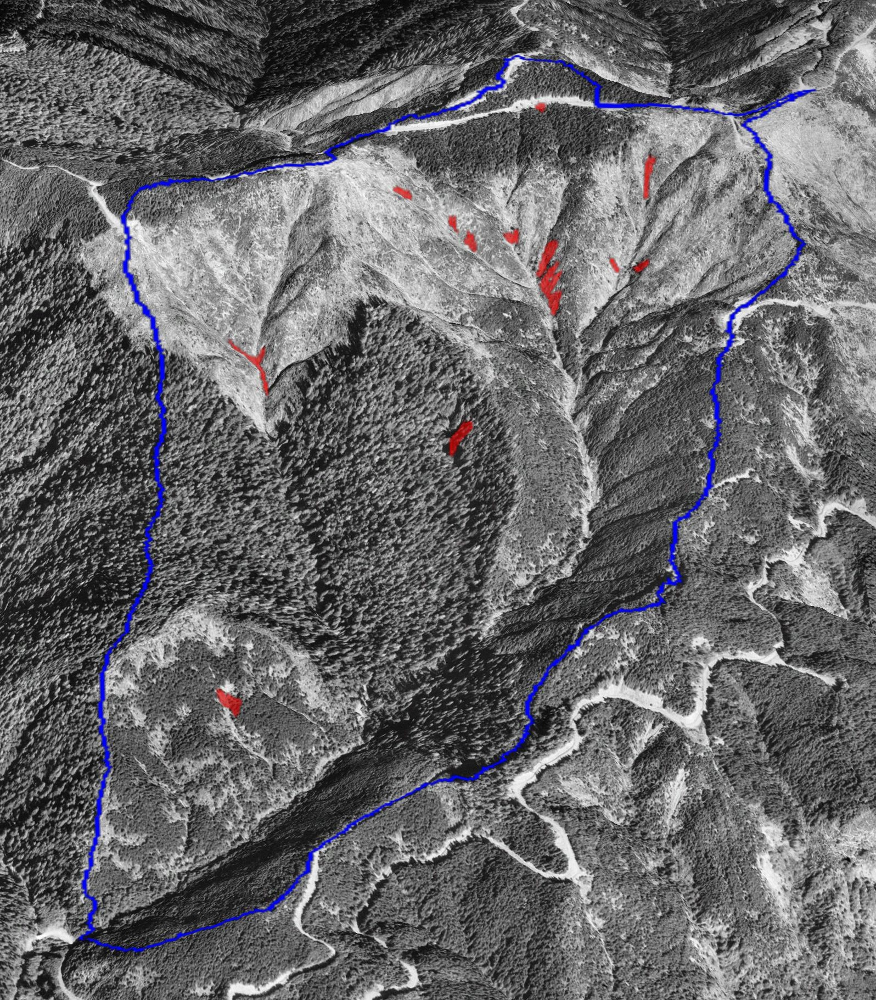
</div> 

<div align="center">
    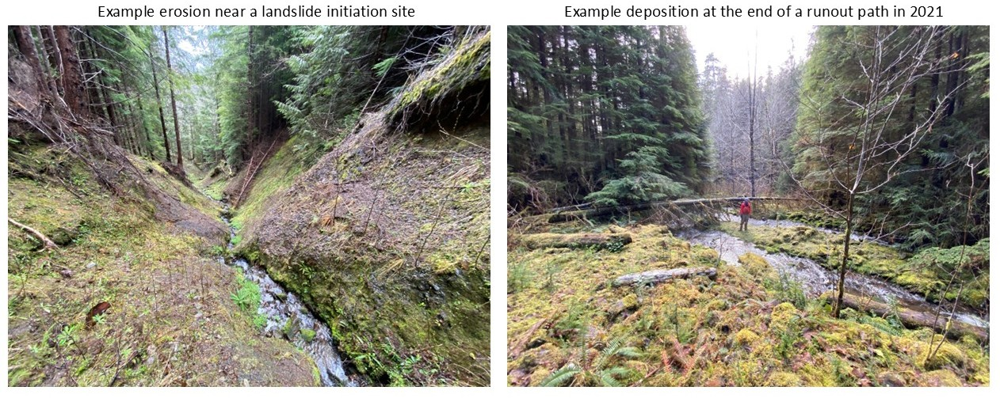
</div>

***To model the runout of this sequence of landslide events, first import  packages and components necessary to load MWR inputs, run MWR and visualize model results.***

In [1]:
import time
import matplotlib.animation as animation
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
import numpy as np
import scipy as sc

from landlab import RasterModelGrid
from landlab.components import FlowAccumulator
from landlab.components import(FlowDirectorD8, 
                                FlowDirectorMFD)


from landlab.components.mass_wasting_runout.MWR_calibrator import (profile_plot,
                                                                define_profile_nodes,
                                                                view_profile_nodes)

from landlab.components.mass_wasting_runout import MassWastingRunout

## import landlab plotting functionality
from landlab.plot.drainage_plot import drainage_plot
from landlab import imshow_grid_at_node

## import functions
# from landlab.io.esri_ascii import write_esri_ascii
from landlab.io import read_esri_ascii
from landlab.io.netcdf import read_netcdf

from landlab.components import ChannelProfiler, FlowAccumulator, DepressionFinderAndRouter
## import esri ascii read function
from landlab.io import esri_ascii

##### Define a few function for visualizing model restuls:

In [2]:
# plot model results over a high-resolution DEM
def plot_node_field_with_shaded_high_res_dem(
    mg,
    mg_hs,
    field,
    save_name=None,
    plot_name=None,
    figsize=(7, 7),
    cmap="terrain",
    fontsize=10,
    alpha=0.5,
    cbr=None,
    norm=None,
    allow_colorbar=True,
    colorbar_label=None,
    var_name=None,
    var_units=None,
    domain_buffer=0,
    title = None,
    **kwds,
):
    if plot_name is None:
        plt.figure(field, figsize=figsize)
    else:
        plt.figure(plot_name, figsize=figsize)


    mg_hs.imshow(
        "hillshade_arc",
        cmap="Greys_r",
        grid_units=("coordinates", "coordinates"),
        shrink=0.75,
        var_name=None,
        var_units=None,
        output=None,
        allow_colorbar=False,
        color_for_background="white",
        color_for_closed="white",
        limits=(0, 360),
    )
    mg.imshow(
        field,
        cmap=cmap,
        grid_units=("coordinates", "coordinates"),
        shrink=0.75,
        var_name=var_name,
        var_units=var_units,
        alpha=alpha,
        output=None,
        color_for_closed=None,
        color_for_background=None,
        norm=norm,
        allow_colorbar=allow_colorbar,
        colorbar_label=colorbar_label,
    )

    plt.xlim(
        [
            mg.x_of_node[mg.core_nodes].min() - 20,
            mg.x_of_node[mg.core_nodes].max() + domain_buffer,
        ]
    )
    plt.ylim(
        [
            mg.y_of_node[mg.core_nodes].min() - 20,
            mg.y_of_node[mg.core_nodes].max() + domain_buffer,
        ]
    )

    plt.xticks(fontsize=fontsize)
    plt.yticks(fontsize=fontsize)
    if cbr is None:
        r_values = mg.at_node[field][mg.core_nodes]
        plt.clim(r_values.min(), r_values.max())
    else:
        plt.clim(cbr[0], cbr[1])

    if title:
        plt.title(title)

    if save_name is not None:
        plt.savefig(save_name + ".png", dpi=300, bbox_inches="tight")

# profile plot of erosion and deposition
def profile_deposition_scour(mg, long_profile_nodes, field, ef = 2.5, xlim = None, ylim = None, aspect = None, figsize = None, fs = 8, title = None):
    if figsize:
        fig, ax = plt.subplots(figsize=figsize)
    else:
        fig, ax = plt.subplots(figsize=(6,2))
    xsd = long_profile_nodes
    x1 = mg.node_x[xsd[0:-1]]
    y1 = mg.node_y[xsd[0:-1]]
    x2 = mg.node_x[xsd[1:]]
    y2 = mg.node_y[xsd[1:]]    
    dist = ((x2-x1)**2+(y2-y1)**2)**.5
    distc =  np.concatenate((np.array([0]), dist.cumsum()))
    y = mg.at_node['topographic__elevation'][xsd]
    y_ = mg.at_node['topographic__initial_elevation'][xsd]
    ydif = mg.at_node[field][xsd]
    y_exag = y_+ef*ydif     
    yd = np.where(ydif<0,np.nan,ydif); xd = distc; yd_ = y
    ys = np.where(ydif>0,np.nan,ydif); xs = distc; ys_ = y
    plt.plot(xd,ef*yd+y_,linestyle = '-', color = 'red', alpha = 0.5, linewidth = 2)
    plt.plot(xs,ef*ys+y_,linestyle = '-', color = 'blue', alpha = 0.5, linewidth = 2)
    plt.plot(distc,y_,'k--', alpha = 0.5, linewidth = 1)
    plt.xlabel('distance along channel [m]', fontsize = fs)
    plt.ylabel('elevation [m]', fontsize = fs)
    plt.grid(alpha = 0.5)
    ax.tick_params(axis = 'both', which = 'major', labelsize = fs)
    if xlim:
        plt.xlim([xlim])
    else:
        plt.xlim([0, max(distc)])
    
    if ylim:
        plt.ylim([ylim])
    else:
        plt.ylim([min(y)*0.75,max(y)*1.1])
        if aspect:
            ax.set_aspect(aspect)
    if title:
        plt.title(title)

In [3]:
# #%% script controls
# # movie of runout
# movie = False
# save_movie = False    
# svnm = 'kunamaskt_2000_smdmn'
# save_demdif = False
# demdifnm = 'kun_t0_'

# # figure domain
# mvx = 70200; mvx_ = 71175
# mvy = 361100; mvy_ = 361600

##### Define key model parameters

In [4]:
#%% model controls
# average thickness of landslide
slpc = 0.126 # critical slope
qsc = 0.112 # critical flux constraint
k = 0.051 # erosion coefficient
f = 0.2 # erosion exponent
max_observed_flow_depth = 4
pd = 0.2 # typical largest grain size
mw_id = 1
vary_cs = False
qsc_constraint = True
routing_surface = "topographic__elevation"
deposition_rule = "critical_slope"
deposit_style = 'downslope_deposit_sc10'
settle_deposit = False
effective_qsi = True
qsi_max = 4
g_erosion = True


##### prepare the gis model inputs

In [5]:
#%% prep model GIS inputs
DEM_pre = 'pre-runout_DEM_OM.asc' # before debris flow dem
DEM_pre_hs = 'pre-runout_DEM_highres_hillshade_OM.asc' # before debris flow dem hs
lsnodes = 'landslide_nodes_OM_simulataneous_release.asc'#'landslide_nodes_OM_sequential_release.asc'# for simulateous release, use: 'landslide_nodes_OM_simulataneous_release.asc' 
DoDo = 'observed_DoD_OM.asc'# observed dem difference
regolith_thickness = 'regolith_thickness_OM.asc'


#%% load input
# dem
with open(DEM_pre) as fp:
    mg = esri_ascii.load(fp, name="topographic__elevation", at="node")
z = mg.at_node["topographic__elevation"]

# save an copy of the initial elevation for dem differencing
_ = mg.add_field('topographic__initial_elevation',
                    mg.at_node['topographic__elevation'],
                    at='node',
                    copy = True)

# define the watershed outlet the outlet 
mg.set_watershed_boundary_condition(z) # finds lowest point in dem and sets it as an open node

# run flow accumulater to get contributing area to each grid cell
fa = FlowAccumulator(mg, 
                      'topographic__elevation',
                      flow_director='FlowDirectorD8')
fa.run_one_step()

# fill depressions to correct surface area determination
df_4 = DepressionFinderAndRouter(mg)
df_4.map_depressions()

# hillshade
mg.at_node['hillshade'] = mg.calc_hillshade_at_node(elevs=z, alt=37., az=210.)

# define the landslide source area nodes
with open(lsnodes) as fp:
    esri_ascii.load(fp, name="mass__wasting_id", at="node", out=mg)
mg.at_node["mass__wasting_id"] = mg.at_node["mass__wasting_id"].astype(int)

# define the observed DoD
with open(DoDo) as fp:
    esri_ascii.load(fp, name="DoD_o", at="node", out=mg)
# change null values to zero
mg.at_node["DoD_o"][mg.at_node["DoD_o"] == -9999] = 0

# create a modeled DoD field, to be updated later to show animation of modeled DoD
mg.at_node["dem_dif_m"] = np.zeros(mg.number_of_nodes)

# define the soil depth using a externally derived soil map
with open(regolith_thickness) as fp:
    esri_ascii.load(fp, name="soil__thickness", at="node", out=mg)
# use depth modeled by dhsvm script
    
# load a high res hillshade for plots
with open(DEM_pre_hs) as fp:
    mg_hs = esri_ascii.load(fp, name="hillshade_arc", at="node")
mg_hs.at_node['hillshade_arc'][mg_hs.at_node['hillshade_arc'] == -9999] = np.nan

# add particle diameter
mg.at_node['particle__diameter'] = np.ones(len(mg.node_x))*pd

# alternatively, define a variable particle diameter, such as north of coordinate y = 5288000 is coarse sandstone derived soils
# mg.at_node['particle__diameter'] = np.ones(len(depth))*0.1
# mg.at_node['particle__diameter'][mg.node_y>5288000] = 0.25

##### check landslide locations and sequence:

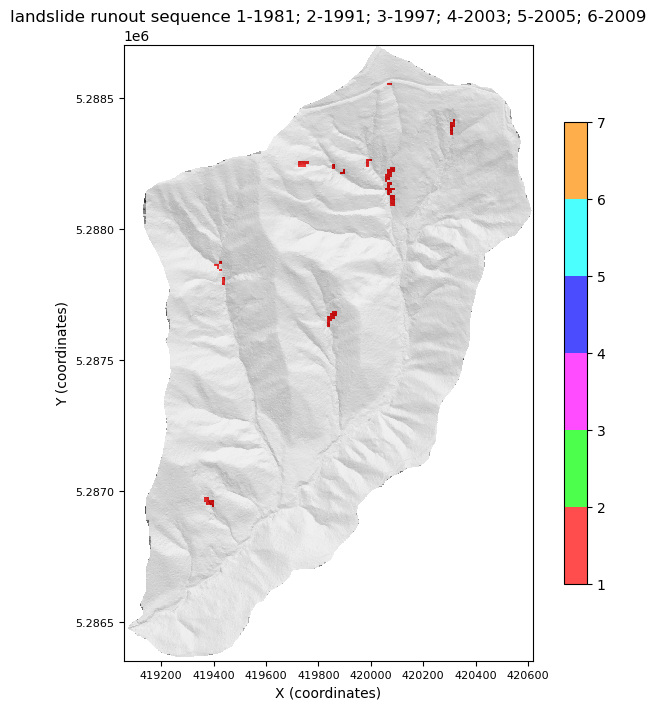

In [6]:
# visually check landslide source areas and sequence of runout
cmap = (mpl.colors.ListedColormap(['red', 'lime', 'magenta','blue', 'cyan','darkorange'])
        .with_extremes(under='white', over='white'))
bounds = [1, 2, 3, 4, 5]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
# plt.figure(figsize = (8,8))
plot_node_field_with_shaded_high_res_dem(mg, mg_hs = mg_hs, field = 'mass__wasting_id', figsize = (8,8), fontsize = 8,cmap = cmap,norm=norm,cbr = [1,7],alpha = .7, title = 'landslide runout sequence 1-1981; 2-1991; 3-1997; 4-2003; 5-2005; 6-2009')
# plt.autoscale(tight=True)
# plt.xticks(fontsize=8)
# plt.yticks(fontsize=8)

In [7]:
# multiflow direction for MWR
# need to delete d8 flow direction
mg.delete_field(loc = 'node', name = 'flow__sink_flag')
mg.delete_field(loc = 'node', name = 'flow__link_to_receiver_node')
mg.delete_field(loc = 'node', name = 'flow__receiver_node')
mg.delete_field(loc = 'node', name = 'topographic__steepest_slope')

# run flow director, add slope and receiving node fields
fd = FlowDirectorMFD(mg, diagonals=True,
                      partition_method = 'slope')
fd.run_one_step()

In [8]:
MWR = MassWastingRunout(mg,
                                critical_slope = slpc,
                                threshold_flux = qsc,                    
                                erosion_coefficient = k,
                                erosion_exponent = f,
                                effective_qsi = True, 
                                save = True, 
                                grain_shear = True, 
                                settle_deposit = False,
                                tracked_attributes = ['particle__diameter'],
                                max_flow_depth_observed_in_field =  max_observed_flow_depth)

In [9]:
start_time = time.time()
MWR.run_one_step()
print("model run took %s seconds ---" % np.round((time.time() - start_time),decimals=1))

model run took 12.9 seconds ---


<Figure size 800x800 with 0 Axes>

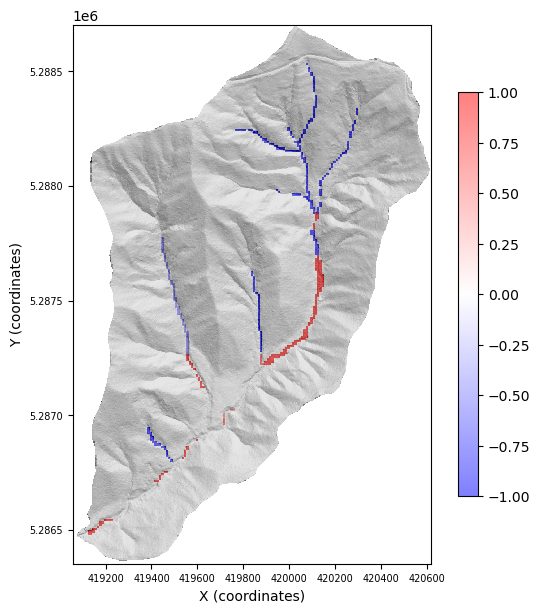

In [10]:
# plot the observed DoD
plt.figure(figsize = (8,8))
plot_node_field_with_shaded_high_res_dem(
    mg, mg_hs=mg_hs, field="DoD_o", cmap="bwr", alpha=0.5, cbr=[-1, 1], fontsize=7
)

<Figure size 800x800 with 0 Axes>

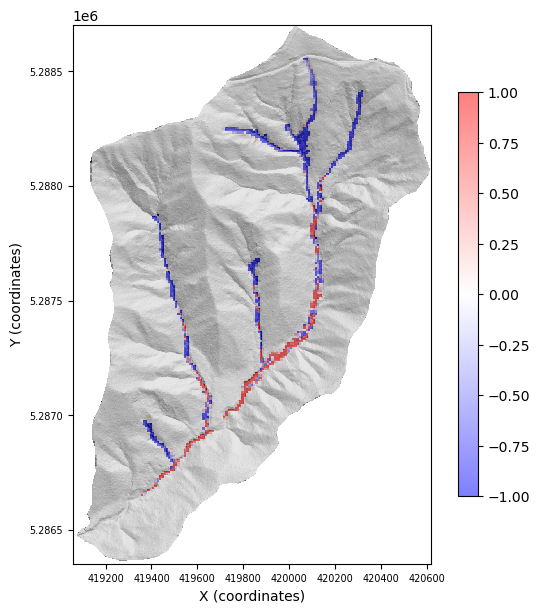

In [11]:
#plot the modeled DoD
# need to first extract the last DoD map from the MWR saver and add it as a field to the grid
all_DoD_maps_dict = {}
c=0
for key_1 in MWR.saver.runout_evo_maps.keys():
    for key_2 in MWR.saver.runout_evo_maps[key_1]:
        all_DoD_maps_dict[c] = MWR.saver.runout_evo_maps[key_1][key_2]
        c+=1
mg.at_node['DoD_m'] = all_DoD_maps_dict[list(all_DoD_maps_dict.keys())[-1]]- mg.at_node["topographic__initial_elevation"]

# now that DoD_m is in the grid, plot
plt.figure(figsize = (8,8))
plot_node_field_with_shaded_high_res_dem(
    mg, mg_hs=mg_hs, field="DoD_m", cmap="bwr", alpha=0.5, cbr=[-1, 1], fontsize=7
)

#### define a long profile location (nodes) that will be used to visual changes to the channel long profile following runout

In [12]:
# use a predefined long profile 
long_profile_nodes = np.array([48901, 48696, 48491, 48286, 48287, 48082, 47877, 47672, 47467,47468, 47263, 47058, 46853, 46854, 46649, 46444, 46239, 46034,46035, 45830, 45625, 45420, 45215, 45010, 44805, 44600, 44395,44190, 43985, 43986, 43781, 43576, 43371, 43166, 43167, 42962,42757, 42758, 42553, 42554, 42349, 42144, 42145, 41940, 41941,41736, 41531, 41532, 41327, 41122, 40917, 40918, 40713, 40508,40303, 40304, 40099, 39894, 39689, 39484, 39279, 39074, 38869,38664, 38459, 38254, 38255, 38050, 37845, 37640, 37435, 37230,37025, 37026, 36821, 36616, 36411, 36412, 36207, 36002, 36003,35798, 35593, 35388, 35183, 34978, 34773, 34568, 34363, 34158,33953, 33748, 33543, 33338, 33133, 33134, 32929, 32724, 32519,32314, 32109, 31904, 31699, 31494, 31289, 31290, 31085, 30880,30675, 30470, 30265, 30060, 29855, 29856, 29651, 29650, 29445, 29240, 29035, 28830, 28625, 28624, 28419, 28214, 28009, 27804, 27599, 27394, 27189, 27188, 26983, 26982, 26777, 26778, 26573, 26368, 26163, 26162, 25957, 25752, 25547, 25342, 25341, 25136, 24931, 24930, 24725, 24520, 24315, 24314, 24109, 24108, 23903, 23902, 23901, 23696, 23695, 23694, 23489, 23488, 23487, 23282, 23281, 23280, 23075, 22870, 22665, 22664, 22663, 22458, 22457, 22252, 22251, 22046, 22045, 21840, 21839, 21634, 21633, 21632, 21631, 21426, 21425, 21220, 21219, 21014, 21013, 21012, 20807, 20806, 20601, 20600, 20395, 20394, 20189, 20188, 19983, 19778, 19573, 19368, 19163, 19162, 18957, 18752, 18547, 18342, 18341, 18136, 17931, 17930, 17929, 17928, 17723, 17722, 17721, 17720, 17515, 17310, 17309, 17104, 16899, 16694, 16489, 16284, 16079, 16078, 16077, 15872, 15871, 15870, 15869, 15868, 15867, 15662, 15661, 15660, 15455, 15454, 15249, 15248, 15043, 15042, 15041, 14836, 14835, 14630, 14629, 14628, 14423, 14218, 14013, 14012, 13807, 13602, 13601, 13396, 13395, 13394, 13189, 13188, 12983, 12778, 12777, 12572, 12571, 12366, 12365, 12160, 12159, 11954, 11953, 11952, 11747, 11746, 11541, 11540, 11335, 11334, 11129, 10924, 10923, 10718, 10717, 10512, 10511, 10510, 10305, 10304, 10303, 10098, 10097,  9892,  9891,  9890,  9685,  9684,  9683, 9682,  9477,  9272,  9067,  9066,  8861,  8860,  8655,  8654, 8449,  8448,  8243,  8242,  8037,  8036,  7831,  7830,  7829, 7828,  7827,  7826,  7621,  7620,  7415,  7414,  7209,  7208, 7003,  7002,  6797,  6796,  6795,  6794,  6589,  6588,  6587, 6382,  6381,  6380])

# alternatively, map your own profile location by uncomenting and running the the code below:

# %matplotlib qt 
# long_profile_nodes, long_profile_dist, Lxy = define_profile_nodes(mg)
# %matplotlib inline

#### Look at the long profile:

Text(0.5, 1.0, 'long profile location')

<Figure size 800x800 with 0 Axes>

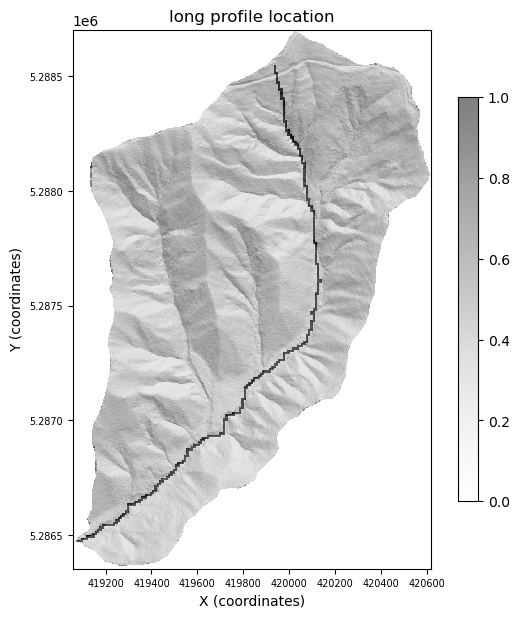

In [13]:
mg.at_node['long_profile'] = np.zeros(mg.number_of_nodes)
mg.at_node['long_profile'][long_profile_nodes] = 1
plt.figure(figsize = (8,8))
plot_node_field_with_shaded_high_res_dem(mg, mg_hs=mg_hs, field="long_profile", cmap="Greys", alpha=0.5, cbr=[0, 1], fontsize=7)
plt.title('long profile location')

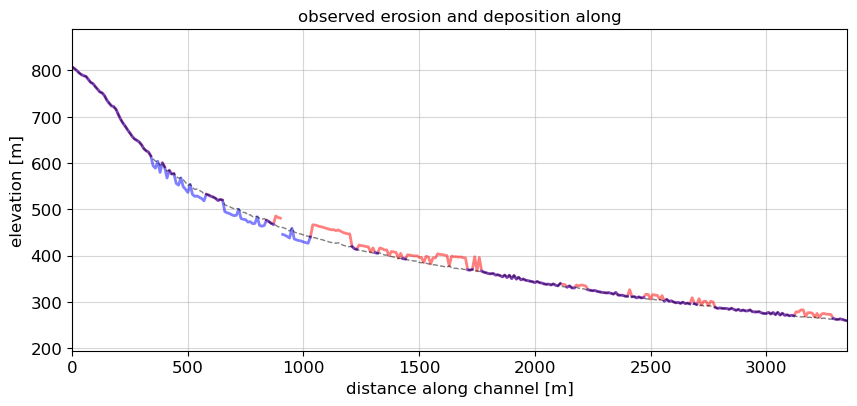

In [14]:
profile_deposition_scour(mg, long_profile_nodes, field = 'DoD_o',  ef = 10, aspect = 2,figsize = (10,5), fs = 12, title ='observed erosion and deposition along')

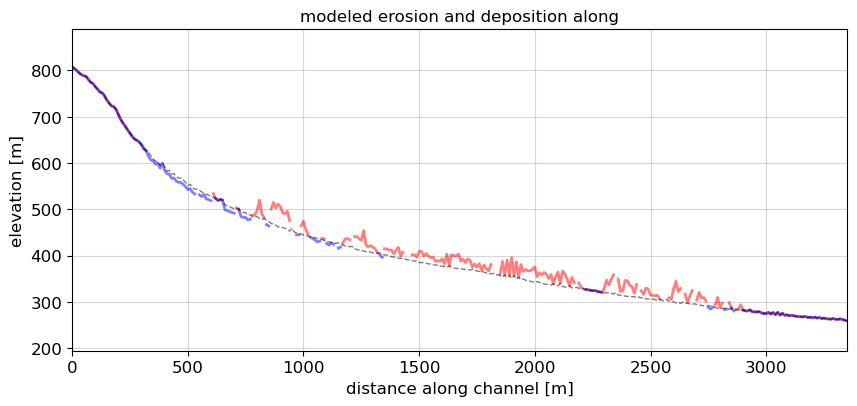

In [15]:
profile_deposition_scour(mg, long_profile_nodes, field = 'DoD_m',  ef = 10, aspect = 2,figsize = (10,5), fs = 12, title = 'modeled erosion and deposition along')

Preparation of runout animation is 100% complete

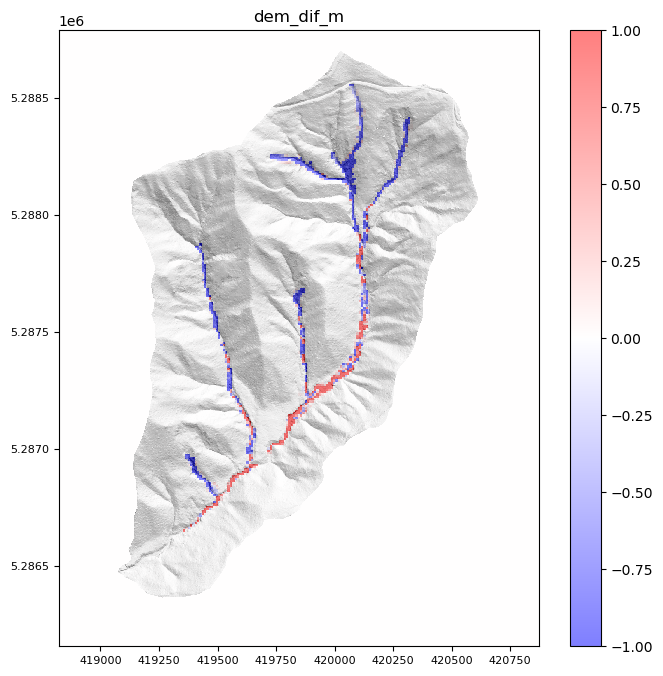

In [16]:
plot_interval = 10 # plot every plot_interval-th frame - note if interval is too short, 
# animation may not include the entire modeled output

# update function
from IPython.display import HTML

def get_values_xy(grid, field):
    # convert grid array to input for pcolormesh (from imshow_grid)
    values = grid.at_node[field]
    values = values.reshape(grid.shape)
    y = (
        np.arange(values.shape[0] + 1) * grid.dy
        - grid.dy * 0.5
        + grid.xy_of_lower_left[1]
    )
    x = (
        np.arange(values.shape[1] + 1) * grid.dx
        - grid.dx * 0.5
        + grid.xy_of_lower_left[0]
    )
    return x, y, values


# plotting function
def color_mesh_vals(clim=[-1, 1]):
    x, y, values = get_values_xy(mg, "dem_dif_m")
    myimage = plt.pcolormesh(x, y, values, cmap="bwr", alpha=0.5)
    myimage.set_rasterized(True)
    myimage.axes.set_aspect("equal")
    plt.autoscale(tight=True)
    plt.clim(clim)
    return myimage

def update_plot(frame_number, MWR, plot):
    mg.at_node["dem_dif_m"] = (
        all_DoD_maps_dict[frame_number]
        - mg.at_node["topographic__initial_elevation"]
    )
    plot[0].set_array(mg.at_node["dem_dif_m"])
    plot[0].remove()
    plot[0] = color_mesh_vals(clim=[-1, 1])
    print(f"\rPreparation of runout animation is {int(100*frame_number/(nmax-plot_interval+1))}% complete", end="")
    return plot

# prepare the first frame
fig = plt.figure(figsize=(8, 8))
c = 0
nmax=len(all_DoD_maps_dict.keys())
x, y, values = get_values_xy(mg_hs, "hillshade_arc")
myimage = plt.pcolormesh(x, y, values, cmap="Greys_r", alpha=1)
myimage.set_rasterized(True)
myimage.axes.set_aspect("equal")
plt.autoscale(tight=True)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plot = [color_mesh_vals(clim=[-1, 1])]
plt.title("dem_dif_m")
cb = plt.colorbar(norm=True)

animate_10 = animation.FuncAnimation(
    fig,
    update_plot,
    np.arange(0,nmax,plot_interval),
    fargs=(MWR, plot),
    blit=True,
    repeat=True,
    cache_frame_data=False,
    interval = 200
)

HTML(animate_10.to_jshtml())